In [1]:
# Import necessary libraries
import os
import numpy as np 
import matplotlib
import matplotlib.pyplot as plt
import SimpleITK as sitk
from matplotlib.colors import LinearSegmentedColormap, Normalize, hex2color
from matplotlib.cm import get_cmap
import math
# Import plot functions
from ioPlotFunctions import plotFunctions
# Initialize plot functions
plotFunctions = plotFunctions()

ModuleNotFoundError: No module named 'ioPlotFunctions'

In [14]:
############### START CONFIGURATION BLOCK ###############
# Define the base path
basePath = r'/space/fast/oim/extendedPart'
# Define selected patient 
patient = "newAcq_050f229dc2bdb64c"
# Define the full subject directory
subjectDir = os.path.join(basePath, patient)
# Define names of the MRI and sCT sub directories used in the data 
MRIDir = 'MR_StorT2'
sCTDir = 'sCT'
nnUNetOutputDir = 'nnUNetOutput'
observerDataDir = 'observerData'
# Define the paths to the MRI, sCT volumes and dose volumes 
MRIVolumePath = os.path.join(subjectDir, MRIDir, 'image.nii.gz')
sCTVolumePath = os.path.join(subjectDir, sCTDir, 'image.nii.gz')
sCTReg2MRIVolumePath = os.path.join(subjectDir, sCTDir, 'image_reg2MRI.nii.gz')
sCTDosePath = os.path.join(subjectDir, sCTDir, 'dose_original.nii.gz')
sCTDoseInterpolatedPath = os.path.join(subjectDir, sCTDir, 'dose_interpolated.nii.gz')
MRIDoseInterpolatedPath = os.path.join(subjectDir, MRIDir, 'dose_interpolated.nii.gz')
# Define path to fiducial point text file and segmentation mask
fiducialTxtPath = os.path.join(subjectDir, MRIDir, 'MRI_T2_DICOM_coords_fiducials.txt')
fiducialMaskPath = os.path.join(subjectDir, MRIDir, 'mask_MRI_T2_coords_fiducials.nii.gz')
# Define path for CTV and rectum uncertainty map
uncertaintyMapCTVPath = os.path.join(subjectDir, MRIDir, nnUNetOutputDir, 'mask_CTVT_427_nnUNet_uncertaintyMap.nii.gz')
uncertaintyMapRectumPath = os.path.join(subjectDir, MRIDir, nnUNetOutputDir, 'mask_Rectum_nnUNet_uncertaintyMap.nii.gz')
# Define paths for DL segmentations
DLCTVPath = os.path.join(subjectDir, MRIDir, nnUNetOutputDir, 'mask_CTVT_427_nnUNet.nii.gz') 
DLRectumPath = os.path.join(subjectDir, MRIDir, nnUNetOutputDir, 'mask_Rectum_nnUNet.nii.gz')
# Define paths for some sample MRI segmentations
MRICTVPath = os.path.join(subjectDir, MRIDir, 'mask_CTVT_427.nii.gz')
MRIPTVPath = os.path.join(subjectDir, MRIDir, 'mask_PTVT_427.nii.gz')
MRIRectumPath = os.path.join(subjectDir, MRIDir, 'mask_Rectum.nii.gz')
MRIFemoralHeadLPath = os.path.join(subjectDir, MRIDir, 'mask_FemoralHead_L.nii.gz')
MRIFemoralHeadRPath = os.path.join(subjectDir, MRIDir, 'mask_FemoralHead_R.nii.gz')
MRIBladderPath = os.path.join(subjectDir, MRIDir, 'mask_Bladder.nii.gz')
# Define paths for some sample sCT segmentations
sCTCTVPath = os.path.join(subjectDir, sCTDir, 'mask_CTVT_427.nii.gz')
sCTPTVPath = os.path.join(subjectDir, sCTDir, 'mask_PTVT_427.nii.gz')
sCTRectumPath = os.path.join(subjectDir, sCTDir, 'mask_Rectum.nii.gz')
sCTFemoralHeadLPath = os.path.join(subjectDir, sCTDir, 'mask_FemoralHead_L.nii.gz')
sCTFemoralHeadRPath = os.path.join(subjectDir, sCTDir, 'mask_FemoralHead_R.nii.gz')
# Define paths for two different observer segmentations (total four available, obsB-E)
MRICTVObsCPath = os.path.join(subjectDir, MRIDir, observerDataDir, 'mask_CTVT_427_step1_obsC.nii.gz') 
MRICTVObsDPath = os.path.join(subjectDir, MRIDir, observerDataDir, 'mask_CTVT_427_step1_obsD.nii.gz')
############### END CONFIGURATION BLOCK ###############

In [16]:
# Load the volumes using SimpleITK
# Image volumes
MRIImage = sitk.ReadImage(MRIVolumePath)
sCTImage = sitk.ReadImage(sCTVolumePath)
sCTReg2MRIImage = sitk.ReadImage(sCTReg2MRIVolumePath)
sCTDoseImage = sitk.ReadImage(sCTDosePath)
sCTDoseInterpolatedImage = sitk.ReadImage(sCTDoseInterpolatedPath)
MRIDoseInterpolatedImage = sitk.ReadImage(MRIDoseInterpolatedPath)
# Fiducial points
fiducialImage  = sitk.ReadImage(fiducialMaskPath)
# Uncertainty maps
uncertaintyMapCTVImage = sitk.ReadImage(uncertaintyMapCTVPath)
uncertainyyMapRectumImage = sitk.ReadImage(uncertaintyMapRectumPath)
# DL segmentations
DLCTVImage = sitk.ReadImage(DLCTVPath)
DLRectumImage = sitk.ReadImage(DLRectumPath)
# Segmentations volumes MRI
MRICTVImage = sitk.ReadImage(MRICTVPath)
MRIRectumImage = sitk.ReadImage(MRIRectumPath)
MRIFemoralHeadLImage = sitk.ReadImage(MRIFemoralHeadLPath)
MRIFemoralHeadRImage = sitk.ReadImage(MRIFemoralHeadRPath)
MRIPTVImage = sitk.ReadImage(MRIPTVPath)
MRIBladderImage = sitk.ReadImage(MRIBladderPath)
# Segmentations volumes sCT 
sCTCTVImage = sitk.ReadImage(sCTCTVPath)
sCTPTVImage = sitk.ReadImage(sCTPTVPath)
sCTRectumImage = sitk.ReadImage(sCTRectumPath)
sCTFemoralHeadLImage = sitk.ReadImage(sCTFemoralHeadLPath)
sCTFemoralHeadRImage = sitk.ReadImage(sCTFemoralHeadRPath)
# Observer segmentations
MRICTVObsCImage = sitk.ReadImage(MRICTVObsCPath)
MRICTVObsDImage = sitk.ReadImage(MRICTVObsDPath)

In [18]:
# Read the fiducial points from the text file. These are DICOM coorinates. 
with open(fiducialTxtPath, 'r', encoding='utf-8') as file:
            lines = file.readlines()

# Assert that the file contains exactly 3 lines
assert len(lines) == 3, f"Expected 3 lines, but found {len(lines)} lines."

# Parse each line and store in a list
coordinates = []
for i, line in enumerate(lines, start=1):
    values = line.strip().split(',')
    # Assert that each line contains exactly 3 values
    assert len(values) == 3, f"Line {i} does not contain exactly 3 values: {line.strip()}"
    coordinates.append(list(map(float, values)))  # Convert to float and append as a list

# Assign each point to its respective variable
point1, point2, point3 = coordinates  # Unpack the list into individual variables
# Output the results
print("Point 1:", point1)
print("Point 2:", point2)
print("Point 3:", point3)

Point 1: [28.92, 10.02, 28.34]
Point 2: [-3.89, 10.49, 8.34]
Point 3: [16.74, 12.37, 3.34]


In [19]:
# Get the numpy arrays of the images from the SimpleITK objects
# Image volumes
MRIArray = sitk.GetArrayFromImage(MRIImage)
sCTArray = sitk.GetArrayFromImage(sCTImage)
sCTReg2MRIArray = sitk.GetArrayFromImage(sCTReg2MRIImage)
sCTDoseArray = sitk.GetArrayFromImage(sCTDoseImage)
sCTDoseInterpolatedArray = sitk.GetArrayFromImage(sCTDoseInterpolatedImage)
MRIDoseInterpolatedArray = sitk.GetArrayFromImage(MRIDoseInterpolatedImage)
# Uncertainty maps
uncertaintyMapCTVArray = sitk.GetArrayFromImage(uncertaintyMapCTVImage)
uncertaintyMapRectumArray = sitk.GetArrayFromImage(uncertainyyMapRectumImage)
# DL segmentations
DLCTVArray = sitk.GetArrayFromImage(DLCTVImage)
DLRectumArray = sitk.GetArrayFromImage(DLRectumImage)
# Fiducial points
fiducialArray = sitk.GetArrayFromImage(fiducialImage)
# Segmentation volumes MRI
MRICTVArray = sitk.GetArrayFromImage(MRICTVImage)
MRIRectumArray = sitk.GetArrayFromImage(MRIRectumImage)
MRIFemoralHeadLArray = sitk.GetArrayFromImage(MRIFemoralHeadLImage)
MRIFemoralHeadRArray = sitk.GetArrayFromImage(MRIFemoralHeadRImage)
MRIPTVArray = sitk.GetArrayFromImage(MRIPTVImage)
MRIBladderArray = sitk.GetArrayFromImage(MRIBladderImage)
# Segmentations volumes sCT
sCTCTVArray = sitk.GetArrayFromImage(sCTCTVImage)
sCTPTVArray = sitk.GetArrayFromImage(sCTPTVImage)
sCTRectumArray = sitk.GetArrayFromImage(sCTRectumImage)
sCTFemoralHeadLArray = sitk.GetArrayFromImage(sCTFemoralHeadLImage)
sCTFemoralHeadRArray = sitk.GetArrayFromImage(sCTFemoralHeadRImage)
# Observer segmentations
MRICTVObsCArray = sitk.GetArrayFromImage(MRICTVObsCImage)
MRICTVObsDArray = sitk.GetArrayFromImage(MRICTVObsDImage)

In [20]:
# Get the image resolutions (spacing in mm) and print it for each image
MRIImageSpacing = MRIImage.GetSpacing()
print(f'MRI image spacing: {MRIImageSpacing}')
uncertaintyMapCTVSapcing = uncertaintyMapCTVImage.GetSpacing()
print(f'CTV uncertainty map spacing: {uncertaintyMapCTVSapcing}')
uncertainyyMapRectumSpacing = uncertainyyMapRectumImage.GetSpacing()
print(f'Rectum uncertainty map spacing: {uncertainyyMapRectumSpacing}')
sCTImageSpacing = sCTImage.GetSpacing()
print(f'sCT image spacing: {sCTImageSpacing}')
sCTReg2MRIImageSpacing = sCTReg2MRIImage.GetSpacing()
print(f'sCT registered to MRI image spacing: {sCTReg2MRIImageSpacing}')
sCTDoseImageSpacing = sCTDoseImage.GetSpacing()
print(f'sCT dose image spacing: {sCTDoseImageSpacing}')
sCTDosenterpolatedImageSpacing = sCTDoseInterpolatedImage.GetSpacing()
print(f'sCT dose interpolated image spacing: {sCTDosenterpolatedImageSpacing}')
MRIDoseInterpolatedImageSpacing = MRIDoseInterpolatedImage.GetSpacing()
print(f'MRI dose interpolated image spacing: {MRIDoseInterpolatedImageSpacing}')
fiducialImageSpacing = fiducialImage.GetSpacing()
print(f'fiducial image spacing: {fiducialImageSpacing}')
MRICTVImageSpacing = MRICTVImage.GetSpacing()
print(f'MRI CTV image spacing: {MRICTVImageSpacing}')
MRIRectumImageSpacing = MRIRectumImage.GetSpacing()
print(f'MRI rectum image spacing: {MRIRectumImageSpacing}')
MRIFemoralHeadLImageSpacing = MRIFemoralHeadLImage.GetSpacing()
print(f'MRI femoral head left image spacing: {MRIFemoralHeadLImageSpacing}')
MRIFemoralHeadRImageSpacing = MRIFemoralHeadRImage.GetSpacing()
print(f'MRI femoral head right image spacing: {MRIFemoralHeadRImageSpacing}')

MRI image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
CTV uncertainty map spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
Rectum uncertainty map spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
sCT image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
sCT registered to MRI image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
sCT dose image spacing: (1.0, 1.0, 0.8333333134651184)
sCT dose interpolated image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
MRI dose interpolated image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
fiducial image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
MRI CTV image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
MRI rectum image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
MRI femoral head left image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
MRI femoral head right image spacing: (0.46880000829696655, 0.46880000829696655, 2.5)


In [21]:
# Get the middle slice of the MRI and sCT volumes each (slices first in the numpy array)
middleSliceMRI = MRIArray.shape[0] // 2
middleSliceSCT = sCTArray.shape[0] // 2
middleSliceDose = sCTDoseArray.shape[0] // 2
# Print the middle slice numbers
print(f'Middle slice MRI: {middleSliceMRI}')
print(f'Middle slice sCT: {middleSliceSCT}')
print(f'Middle slice sCT dose: {middleSliceDose}')

Middle slice MRI: 44
Middle slice sCT: 44
Middle slice sCT dose: 132


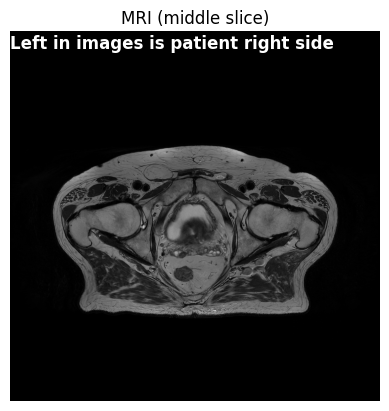

In [22]:
## Basic visualization of the data

# Plot MRI for the middle slice
plt.imshow(MRIArray[middleSliceMRI, :, :], cmap='gray')
plt.title('MRI (middle slice)')
# Add comment below on patient orientation
plt.text(0, 45, 'Left in images is patient right side', color='white', fontsize=12, fontweight='bold')
plt.axis('off')
plt.show()

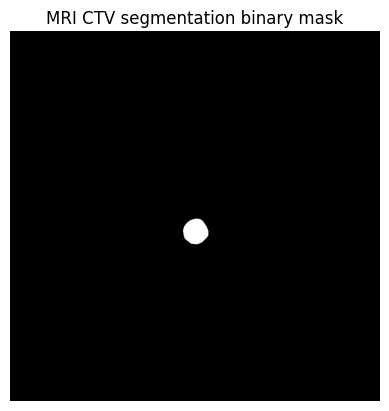

In [23]:
# Plot the MRI CTV segmentation for the middle slice
plt.imshow(MRICTVArray[middleSliceMRI, :, :], cmap='gray')
plt.title('MRI CTV segmentation binary mask')
plt.axis('off')
plt.show()

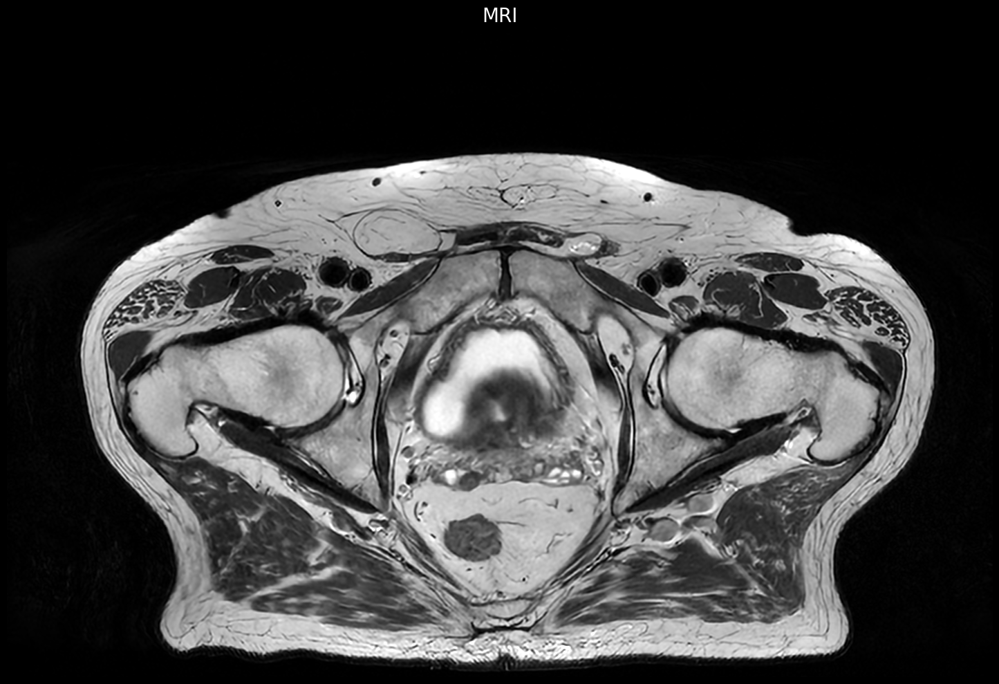

In [24]:
## Advanced methods for data visualization using provided functions

# Plot MRI
plotFunctions.plotData(MRIArray, showDosemap=False, showStructArrays=False, Title="MRI", zooming=True, zoomingShape=[50, 960, 800, 200])

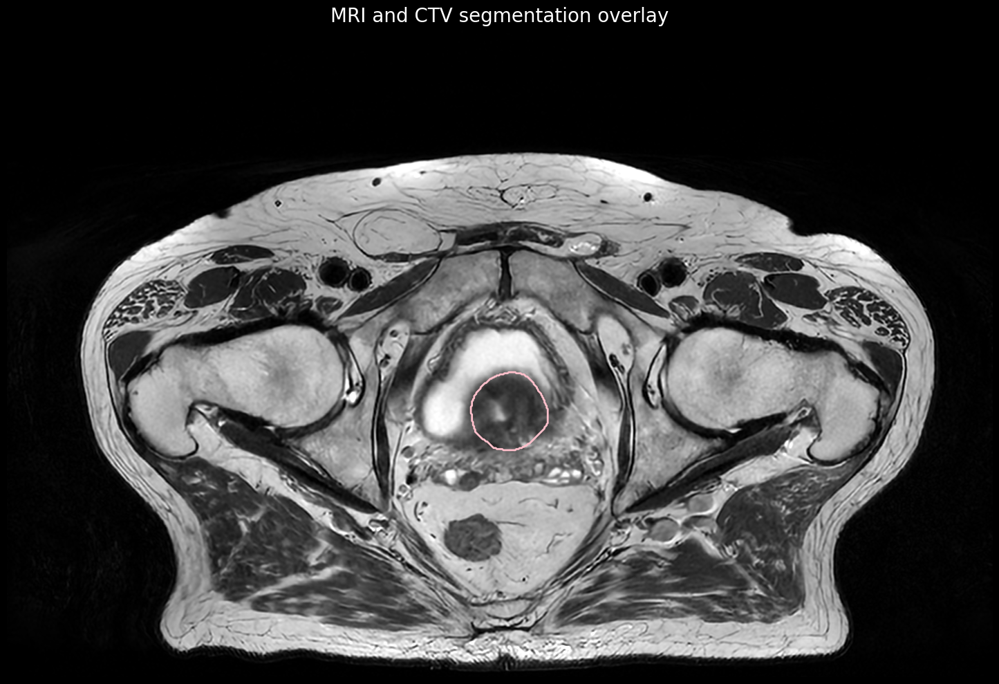

In [25]:
# Plot the MRI and the CTV segmentation
plotFunctions.plotData(MRIArray, structCTVArray=MRICTVArray, showDosemap=False, showStructArrays=True, Title="MRI and CTV segmentation overlay", zooming=True, zoomingShape=[50, 960, 800, 200])

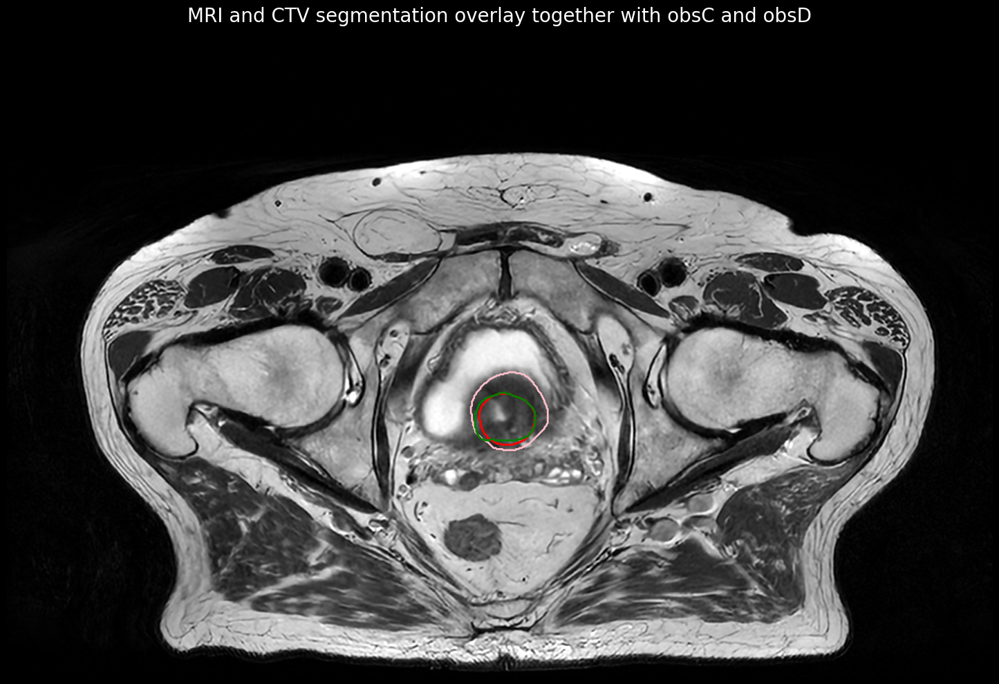

In [26]:
# Plot the MRI CTV segmentation with observer C and D in different colors
plotFunctions.plotData(MRIArray, structCTVArray=MRICTVArray, MRICTVObsDImage=MRICTVObsCArray, MRICTVObsCImage=MRICTVObsDArray, showDosemap=False, showStructArrays=True, Title="MRI and CTV segmentation overlay together with obsC and obsD", zooming=True, zoomingShape=[50, 960, 800, 200])

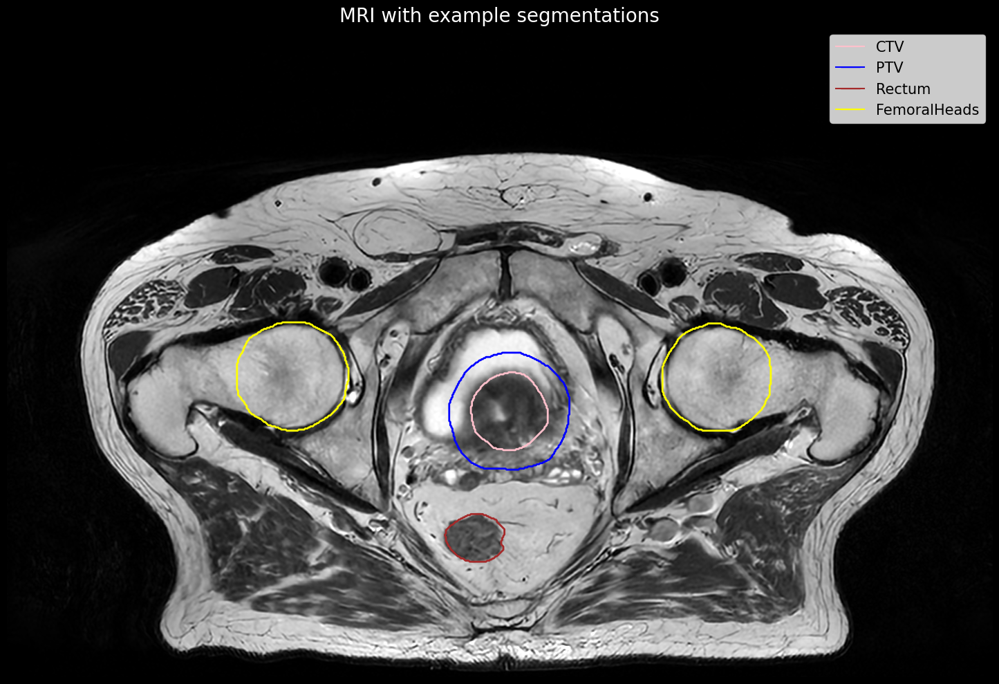

In [29]:
# Plot MRI with segmentations
plotFunctions.plotData(MRIArray, structCTVArray=MRICTVArray, structRectumArray=MRIRectumArray, structPTVArray=MRIPTVArray, structFemoralHeadLArray=MRIFemoralHeadLArray, 
        structFemoralHeadRArray=MRIFemoralHeadRArray, showDosemap=False, showStructArrays=True, Title="MRI with example segmentations", showLegend=True, zooming=True, zoomingShape=[50, 960, 800, 200])

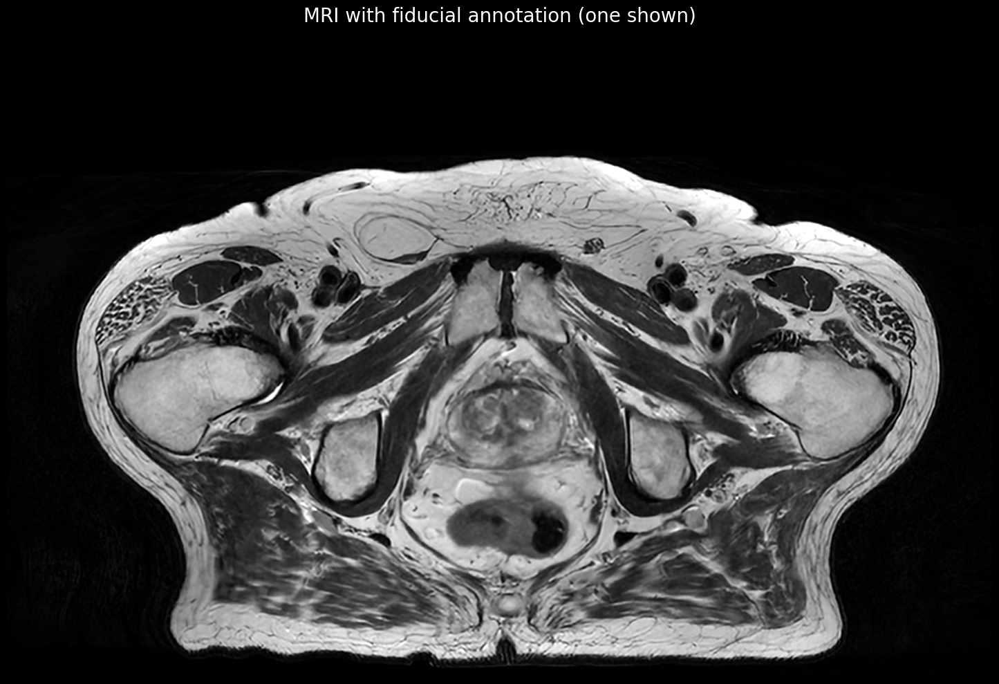

In [30]:
# Plot MRI with fiducial annotation (one of the fiducials is shown)
plotFunctions.plotData(MRIArray, structFiducialArray=fiducialArray, slice_ax=37 , showDosemap=False, showStructArrays=True, Title="MRI with fiducial annotation (one shown)", showLegend=False, zooming=True, zoomingShape=[50, 960, 800, 200])

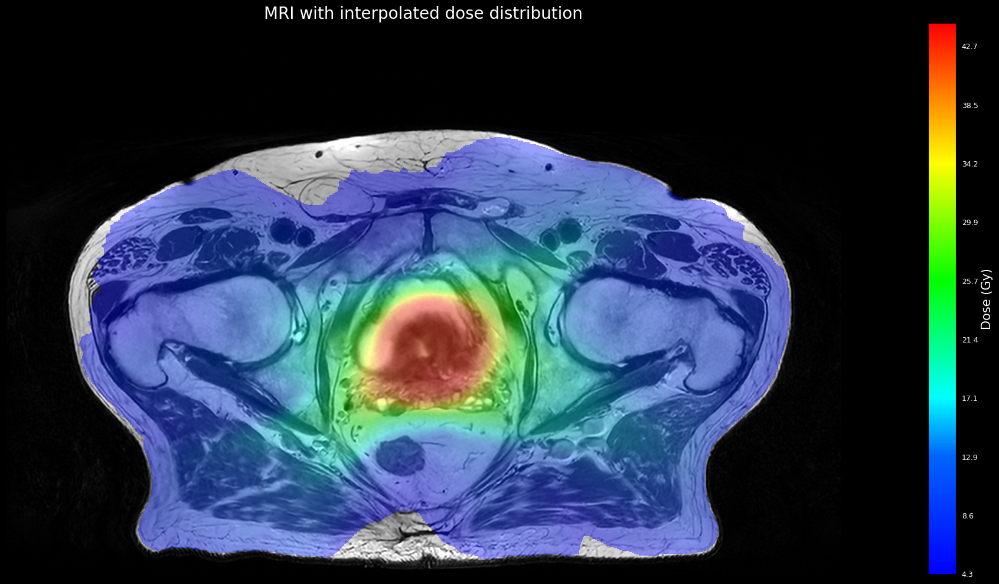

In [31]:
# Plot dose distribution on MRI
plotFunctions.plotData(MRIArray, doseMapArray=MRIDoseInterpolatedArray, showDosemap=True, showStructArrays=False, Title='MRI with interpolated dose distribution', ct=False, zooming=True, zoomingShape=[50, 960, 800, 200])

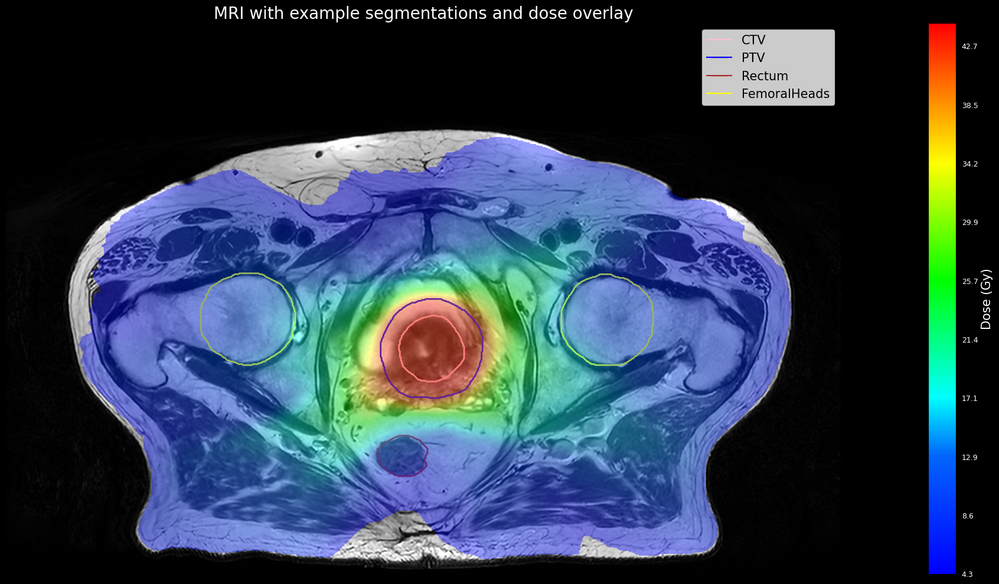

In [32]:
# Plot MRI with segmentations and dose overlay
plotFunctions.plotData(MRIArray, doseMapArray=MRIDoseInterpolatedArray, showDosemap=True, structCTVArray=MRICTVArray, structRectumArray=MRIRectumArray, structPTVArray=MRIPTVArray, structFemoralHeadLArray=MRIFemoralHeadLArray, 
        structFemoralHeadRArray=MRIFemoralHeadRArray, showStructArrays=True, Title="MRI with example segmentations and dose overlay", showLegend=True, zooming=True, zoomingShape=[50, 960, 800, 200])

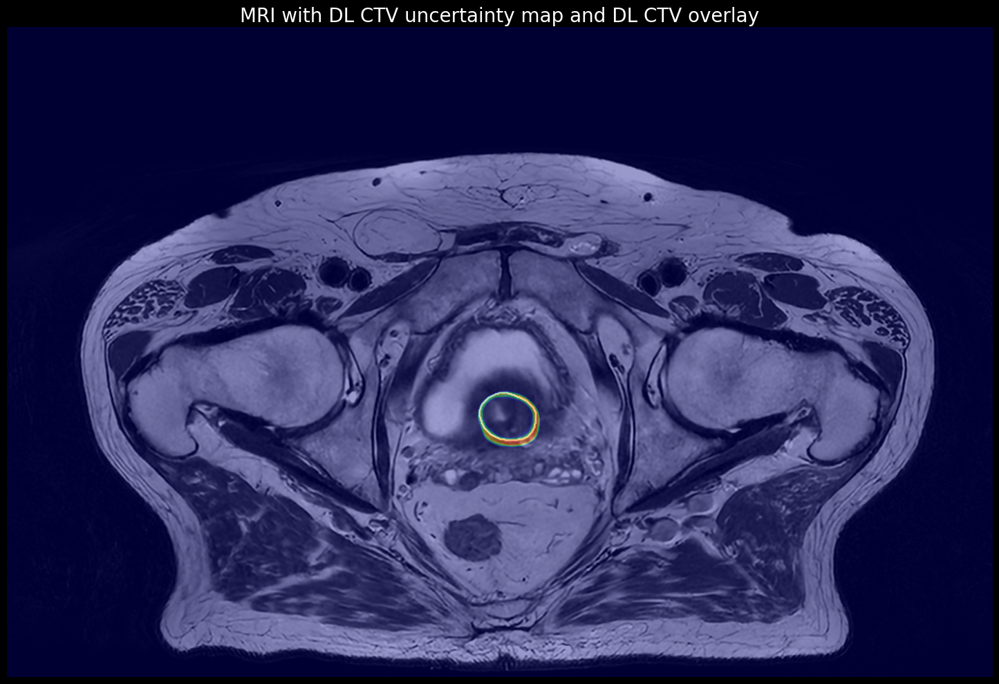

In [36]:
# Plot MRI and DL CTV uncertainty map with CTV overlay
plotFunctions.plotData(MRIArray, uncertaintyMapArray=uncertaintyMapCTVArray, structCTVArray=DLCTVArray, showStructArrays=True, showUncertainty=True, Title='MRI with DL CTV uncertainty map and DL CTV overlay', ct=False, zooming=True, zoomingShape=[50, 960, 800, 200])
#zoomingShape=[440, 580, 560, 420]

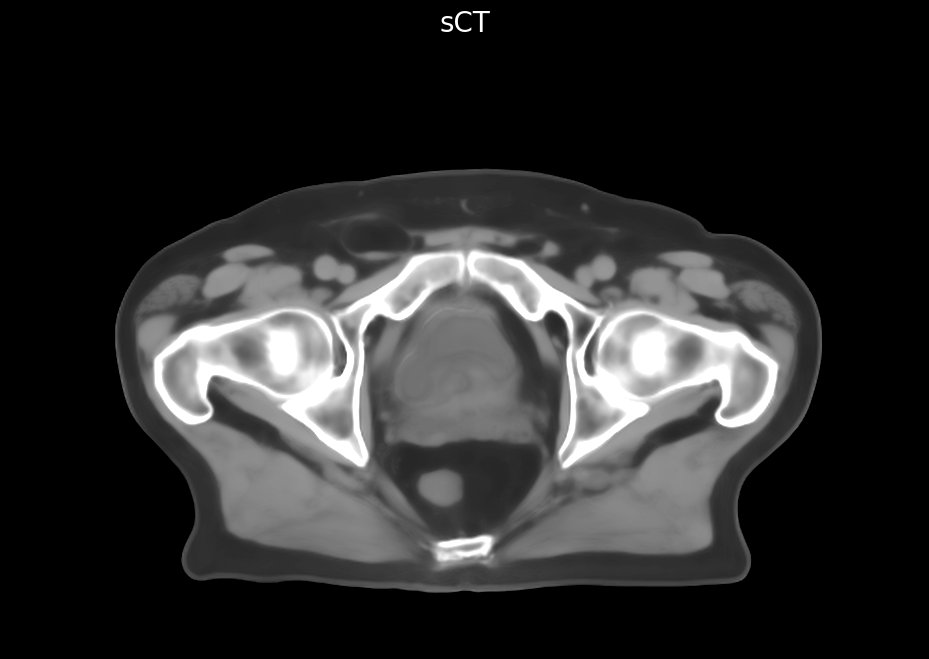

In [34]:
# Plot original sCT
plotFunctions.plotData(sCTArray,Title='sCT', ct=True)

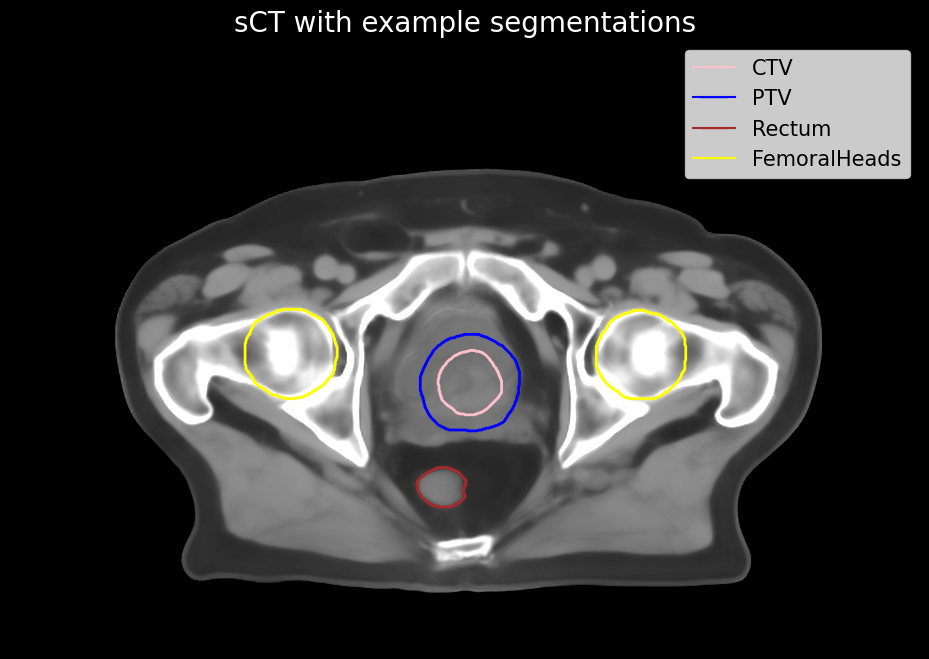

In [37]:
# Plot original sCT with example segmentations 
plotFunctions.plotData(sCTArray, structCTVArray=sCTCTVArray, structRectumArray=sCTRectumArray, structPTVArray=sCTPTVArray, structFemoralHeadLArray=sCTFemoralHeadLArray, 
        structFemoralHeadRArray=sCTFemoralHeadRArray, showDosemap=False, showStructArrays=True, Title="sCT with example segmentations", showLegend=True, ct=True)

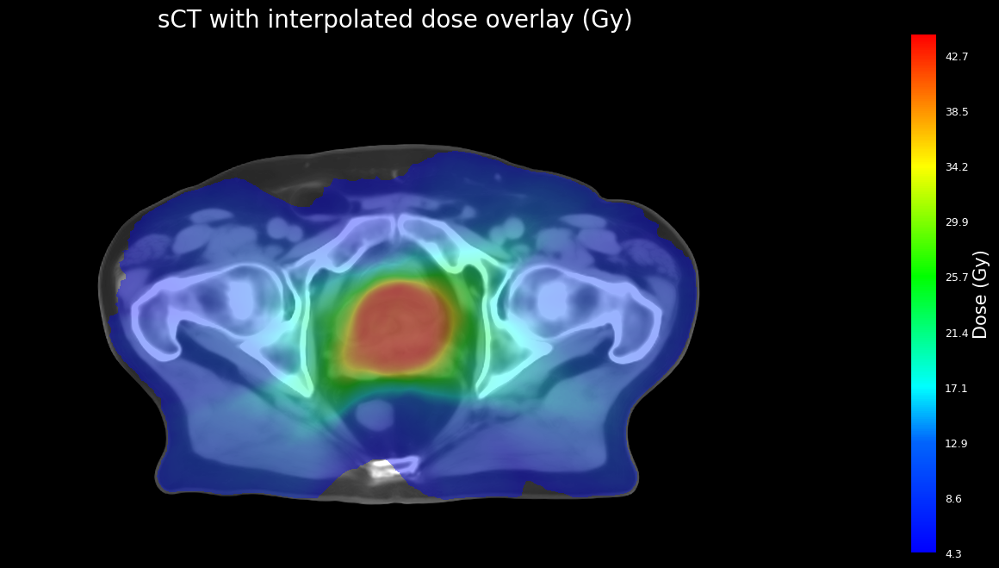

In [38]:
# Plot sCT with interpolated dose overlay
plotFunctions.plotData(sCTArray, doseMapArray=sCTDoseInterpolatedArray, showDosemap=True, showStructArrays=False, Title='sCT with interpolated dose overlay (Gy)', ct=True)

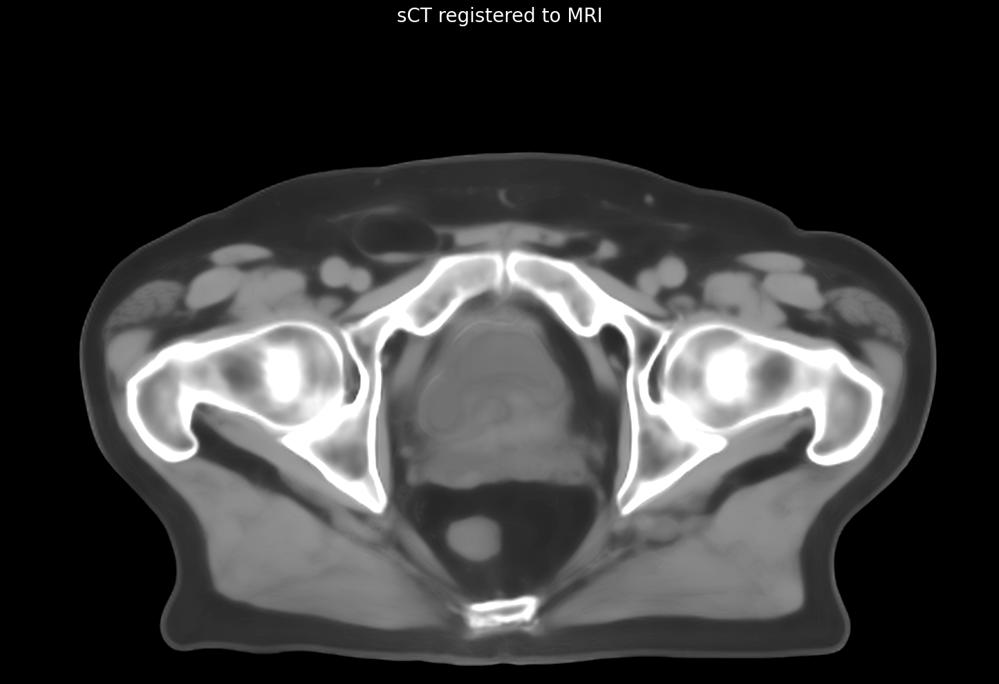

In [39]:
# Plot sCT registered to MRI
plotFunctions.plotData(sCTReg2MRIArray, Title='sCT registered to MRI', ct=True, zooming=True, zoomingShape=[50, 960, 800, 200])

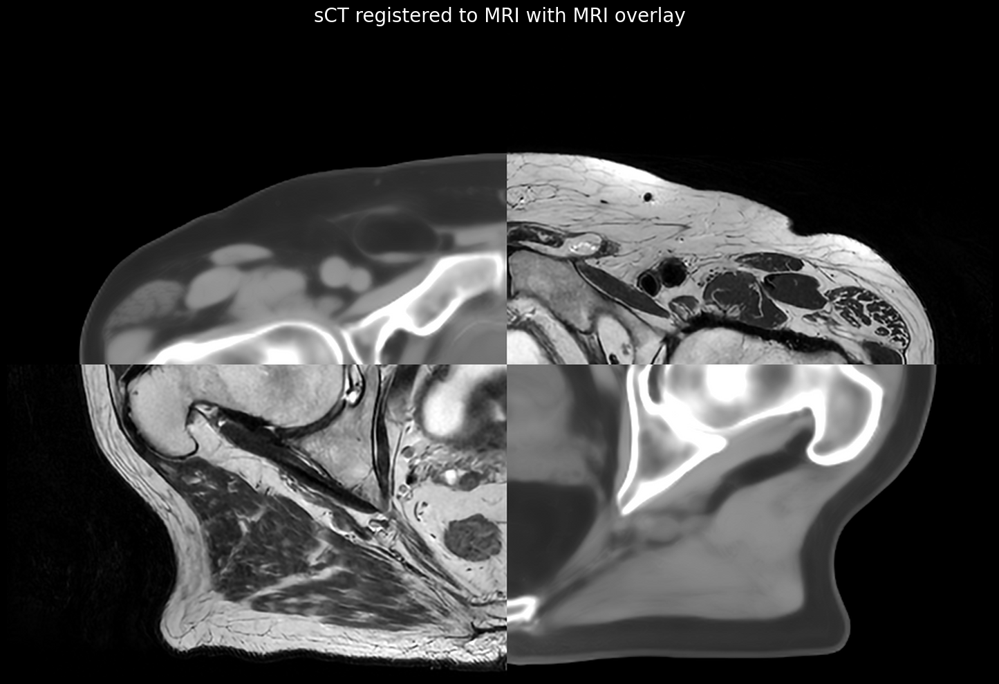

In [40]:
plotFunctions.plotMRIandsCT(MRIArray, sCTReg2MRIArray, Title='sCT registered to MRI with MRI overlay', zooming=True, zoomingShape=[50, 960, 800, 200])

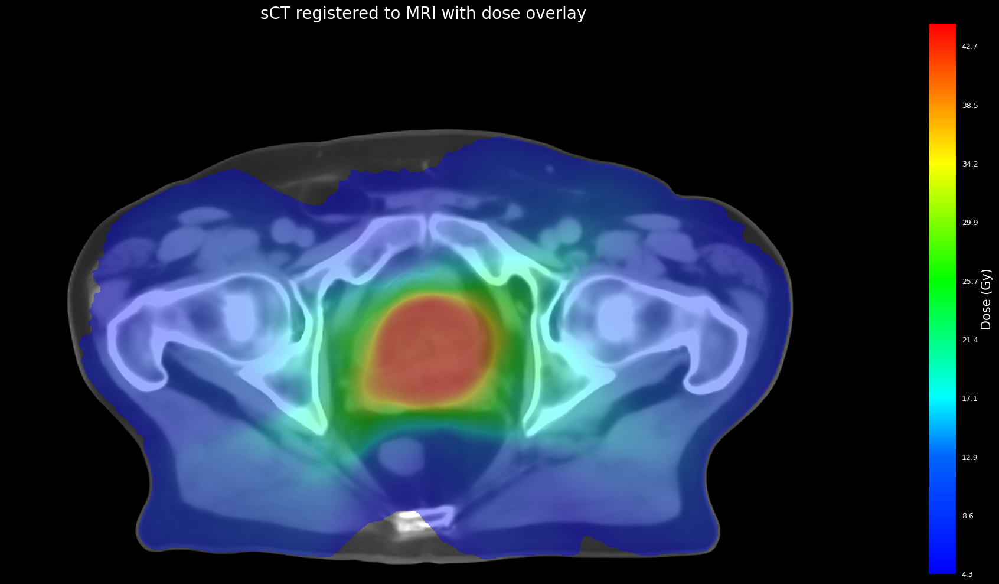

In [41]:
# Plot registered sCT with dose overlay
# Notice use of MRI geometry for dose overlay
# Plot registered sCT with interpolated dose overlay
plotFunctions.plotData(sCTReg2MRIArray, doseMapArray=MRIDoseInterpolatedArray, showDosemap=True, showStructArrays=False, Title='sCT registered to MRI with dose overlay', ct=True, zooming=True, zoomingShape=[50, 960, 800, 200])

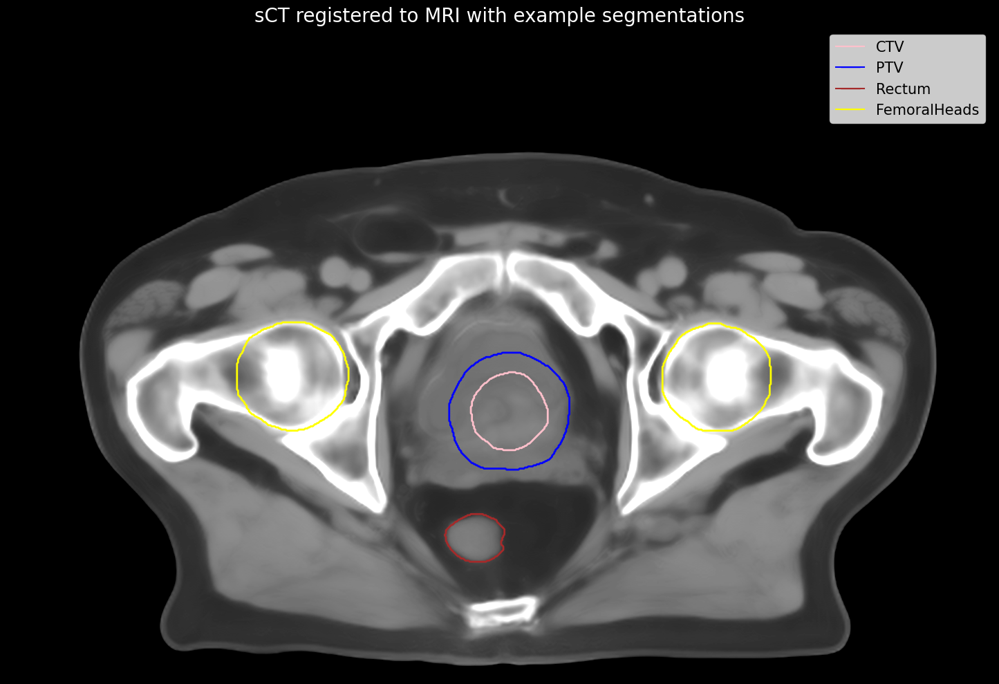

In [42]:
# Plot sCT registered to MRI with segmentations 
# Notice use of MRI segmentations for overlay
plotFunctions.plotData(sCTReg2MRIArray, structCTVArray=MRICTVArray, structRectumArray=MRIRectumArray, structPTVArray=MRIPTVArray, structFemoralHeadLArray=MRIFemoralHeadLArray, 
        structFemoralHeadRArray=MRIFemoralHeadRArray, showDosemap=False, ct=True, showStructArrays=True, Title="sCT registered to MRI with example segmentations", showLegend=True, zooming=True, zoomingShape=[50, 960, 800, 200])

sCT voxel spacing: (0.46880000829696655, 0.46880000829696655, 2.5)
sCT dose voxel spacing: (1.0, 1.0, 0.8333333134651184)
sCT origin: (-227.04080200195312, -176.55929565429688, -74.15794372558594)
sCT dose origin: (-179.10684204101562, -133.0406036376953, -74.99127960205078)
sCT size: (1018, 682, 88)
sCT dose size: (386, 251, 264)
Resampled sCT voxel spacing: (1.0, 1.0, 0.8333333134651184)
Resampled sCT origin: (-179.10684204101562, -133.0406036376953, -74.99127960205078)
Resampled sCT size: (386, 251, 264)


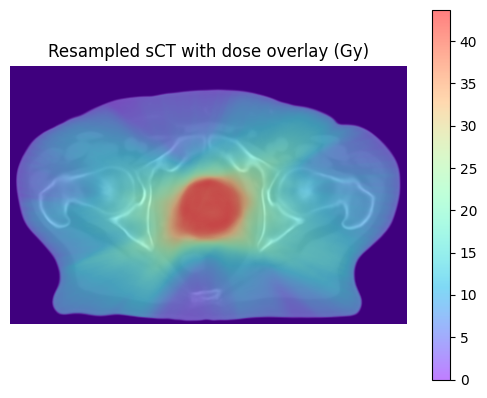

In [43]:
# To resampled data to another coordinate system SITK provides a function called Resample
# Lets resample the sCT to the original low resolution dose grid

# Print voxel spacing of the sCT and dose
print(f'sCT voxel spacing: {sCTImageSpacing}')
print(f'sCT dose voxel spacing: {sCTDoseImageSpacing}')
# Print origin of the sCT and dose
print(f'sCT origin: {sCTImage.GetOrigin()}')
print(f'sCT dose origin: {sCTDoseImage.GetOrigin()}')
# Print size of the sCT and dose
print(f'sCT size: {sCTImage.GetSize()}')
print(f'sCT dose size: {sCTDoseImage.GetSize()}')
# These differ as expected

# Register and resample the sCT to the dose grid
resample = sitk.ResampleImageFilter()
# Set the reference image to the dose
resample.SetReferenceImage(sCTDoseImage)
# Resample with linear interpolation
resample.SetInterpolator(sitk.sitkLinear)
resampled_image = resample.Execute(sCTImage)
# Get np array of the resampled sCT
resampled_sCTArray = sitk.GetArrayFromImage(resampled_image)

# Check matrix (size) dimensions between dose and resampled CT
assert sCTDoseImage.GetSize() == resampled_image.GetSize(), "Matrix size mismatch between dose and resampled CT."
# Check voxel size (spacing)
assert sCTDoseImage.GetSpacing() == resampled_image.GetSpacing(), "Voxel size mismatch between dose and resampled CT."
# Check orientation (direction)
assert sCTDoseImage.GetDirection() == resampled_image.GetDirection(), "Orientation mismatch between dose and resampled CT."
# Check spatial origin offsets
assert sCTDoseImage.GetOrigin() == resampled_image.GetOrigin(), "Spatial origin offset mismatch between dose and resampled CT."

# Print new voxel spacing of the resampled sCT, origin and size
print(f'Resampled sCT voxel spacing: {resampled_image.GetSpacing()}')
print(f'Resampled sCT origin: {resampled_image.GetOrigin()}')
print(f'Resampled sCT size: {resampled_image.GetSize()}')

# Plot the resampled sCT and dose overlay
plt.imshow(resampled_sCTArray[middleSliceDose, :, :], cmap='gray')
plt.imshow(sCTDoseArray[middleSliceDose, :, :], cmap='rainbow', alpha=0.5)
plt.title('Resampled sCT with dose overlay (Gy)')
plt.axis('off')
plt.colorbar() 
plt.show()

In [44]:
createPaperPlots = False

In [45]:
# FOR PAPER: Plot MRI with segmentations
if createPaperPlots == True: 
        plotFunctions.plotData(MRIArray, structCTVArray=MRICTVArray, structFiducialArray=fiducialArray, structRectumArray=MRIRectumArray, structPTVArray=MRIPTVArray, structFemoralHeadLArray=MRIFemoralHeadLArray, 
                structFemoralHeadRArray=MRIFemoralHeadRArray, showDosemap=False, showStructArrays=True, Title=None, showLegend=True, zooming=True, zoomingShape=[50, 960, 800, 200], slice_ax=42)
        # Save figure
        plt.savefig('MRI_with_segmentations.png', dpi=300, bbox_inches='tight')